In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd

In [2]:
FILEPATH='data/block_2010_data/nhgis0005_csv'
relevant_cols = ['GISJOIN', 'STATEA', 'COUNTYA', 'H7X001', 'H7X002', 'H7X003', 'H7X004', 
                               'H7X005', 'H7X006', 'H7X007', 'H7X008']
race_raw = pd.read_csv(f'{FILEPATH}/nhgis0005_ds172_2010_block.csv', 
                       usecols=relevant_cols, 
                       dtype={'GISJOIN': str, 'STATEA': str, 'COUNTYA': str})
column_mapper = dict(zip(relevant_cols, ['GISJOIN', 'state_fips', 'county_fips', 'total', 'white',
                                        'black', 'american_indian_al_native', 'asian', 
                                        'hawaiian_pac_islander', 'other', 'two_plus']))
race_raw.rename(columns=column_mapper, inplace=True)
print("Race data loaded.")
race_raw.set_index('GISJOIN', inplace=True)
race_raw

Race data loaded.


,state_fips,county_fips,total,white,black,american_indian_al_native,asian,hawaiian_pac_islander,other,two_plus
GISJOIN,,,,,,,,,,
G06000104001001000,06,001,0,0,0,0,0,0,0,0
G06000104001001001,06,001,0,0,0,0,0,0,0,0
G06000104001001002,06,001,0,0,0,0,0,0,0,0
G06000104001001003,06,001,0,0,0,0,0,0,0,0
G06000104001001004,06,001,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
G42013300240022033,42,133,19,18,0,0,0,0,0,1
G42013300240022034,42,133,48,48,0,0,0,0,0,0
G42013300240022035,42,133,16,16,0,0,0,0,0,0


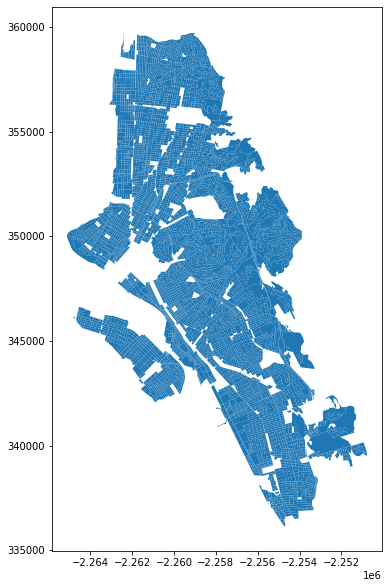

In [3]:
oakland_blocks = gpd.read_file(
    'data/block_2010_data/nhgis0005_shape/nhgis0005_shapefile_tl2010_060_block_2010/CA_block_2010.shp').set_index('GEOID10')
oakland_rl_cw = pd.read_csv('data/outputs/Oakland_blocks_2010_crosswalk.csv', dtype={'block_id_2010': str}).set_index('block_id_2010')
oakland_blocks = oakland_blocks.join(oakland_rl_cw, how='outer').dropna().set_index('GISJOIN')
oakland_blocks.plot(figsize=(10,10))

In [4]:
oakland = oakland_blocks.join(race_raw, how='outer').dropna()

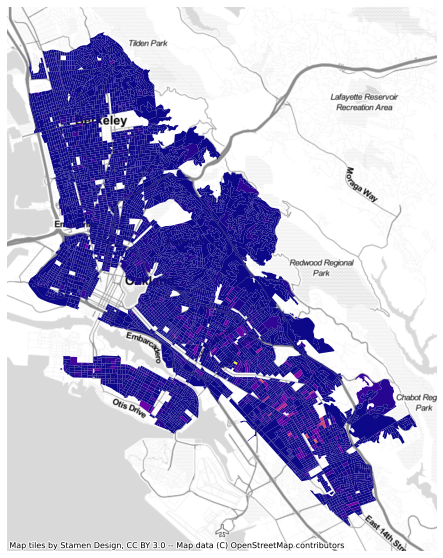

In [5]:
import contextily as ctx
def plot_map(df, column, figsize=(10,10), cmap='plasma'):
    ax = df.to_crs(epsg=3857).plot(figsize=figsize, cmap=cmap, column=column)
    ax.set_axis_off()
    ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

plot_map(oakland, 'hawaiian_pac_islander')

In [6]:
R = oakland.groupby('holc_id_uq').sum().filter(['total', 'white', 'black', \
    'american_indian_al_native', 'asian', 'hawaiian_pac_islander', \
    'hawaiian_pac_islander', 'other', 'two_plus'])

In [7]:
R

,total,white,black,american_indian_al_native,asian,hawaiian_pac_islander,hawaiian_pac_islander,other,two_plus
holc_id_uq,,,,,,,,,
A0,9562,7170,656,26,976,13,13,132,589
A1,5105,4119,103,5,543,11,11,68,256
A10,1897,1369,41,3,365,2,2,13,104
A11,1756,1311,150,4,187,1,1,12,91
A2,382,161,68,1,126,0,0,7,19
...,...,...,...,...,...,...,...,...,...
D115,3996,1859,857,11,880,5,5,107,277
D116,16039,4564,7850,126,1364,35,35,1029,1071
D117,11885,2832,5556,117,1116,40,40,1486,738


In [8]:
R.to_numpy()[4]

array([382, 161,  68,   1, 126,   0,   0,   7,  19])

In [9]:
def city_entropy(R, P):
    """
    Computes entropy of a city-region (see White, 1986).

    Parameters
    ----------
    R : numpy.ndarray
        i-by-j matrix, where i=districts and j=ethnicities.
    P : numpy.array
        i-length vector of the total population in a city-region.
    
    Returns
    -------
    int
        citywide segregation entropy score.
    """
    # define key terms in algorithm
    N = sum(P)
    i, j = R.shape
    R_prop = np.apply_along_axis(lambda column: column / P, 0, R)
    r_hat = R.sum(axis=0) / N

    
    def entropy(x):
        """compute an entropy score with region ethnicity proportion vector x."""
        with np.errstate(divide='ignore'):
            vec = np.log(x)
        vec[np.isneginf(vec)] = 0 # fix special case where 0 * ln(0) = 0
        return (-1) * sum(x*vec)
    
    # compute district-level entropy scores
    h_i = list(map(entropy, R_prop))

    # compute city-wide entropy
    H_hat = entropy(r_hat)
    H_bar = sum((P/N) * h_i)
    
    return (H_hat - H_bar) / H_hat


In [10]:
import time
b = time.time()
for i in range(10000):
    city_entropy(R.to_numpy()[:, 1:], R.to_numpy()[:, 0])
print(f'{time.time() - b}s')

16.985554933547974s


In [11]:
17.408134698867798 / 10000

0.0017408134698867798

In [12]:
def chain_to_entropy(chainobj, blocks):
    """
    Takes element in Markov Chain and computes entropy score using the partition map.
    Parameters
    ----------
    chainobj : gerrychain.partition.partition.Partition
        Partition object that dictates which elements belong to which partitions.
    blocks : geopandas.GeoDataFrame
        Dataframe containing the map's census blocks and associated race information.
    
    Returns
    -------
    int
        entropy score using the partition data from Markov Chain element.
    """
    # use partition parts and grouping to create R and P
    R = blocks.drop(columns=['geometry']).copy()
    R['partition'] = blocks.index.map(dict(chainobj.assignment))
    R = R.groupby('partition').sum()
    R, P = R.to_numpy()[:, 1:], R.to_numpy()[:, 0]

    return city_entropy(R, P)

In [13]:
race_matrix = oakland.filter(['total', 'white', 'black', 'american_indian_al_native', 'asian', 'hawaiian_pac_islander', 'other', 'two_plus', 'holc_id_uq', 'geometry'])
race_matrix.rename(columns={'holc_id_uq': 'partition'}, inplace=True)

In [14]:
def compute_total_pop(partition):
    global race_matrix
    R = race_matrix.drop(columns=['geometry']).copy()
    R['partition'] = race_matrix.index.map(dict(partition.assignment))
    return R.groupby('partition').sum()['total'].to_dict()

In [15]:
from gerrychain import (GeographicPartition, Partition, Graph, MarkovChain, proposals, updaters, constraints, accept)
from gerrychain.updaters import Tally
from gerrychain.proposals import recom, propose_chunk_flip, propose_random_flip
from gerrychain.constraints import districts_within_tolerance, no_vanishing_districts, WithinPercentRangeOfBounds
from gerrychain.accept import always_accept
from functools import partial
from tqdm.notebook import tqdm
import networkx as nx

graph = Graph.from_geodataframe(race_matrix, adjacency='queen')

In [16]:
# from networkx import is_connected, connected_components
# components = list(connected_components(graph))
# biggest_component_size = max(len(c) for c in components)
# problem_components = [c for c in components if len(c) != biggest_component_size]
# for component in problem_components:
#     for node in component:
#         graph.remove_node(node)
# is_connected(graph)

# # prune from race_matrix too
# count = 0
# for i in race_matrix.index:
#     if i not in set(graph.nodes.keys()):
#         race_matrix.drop(i, inplace=True)

(-2265831.78042166, -2250056.131527729, 334977.8153046182, 360956.83201386133)

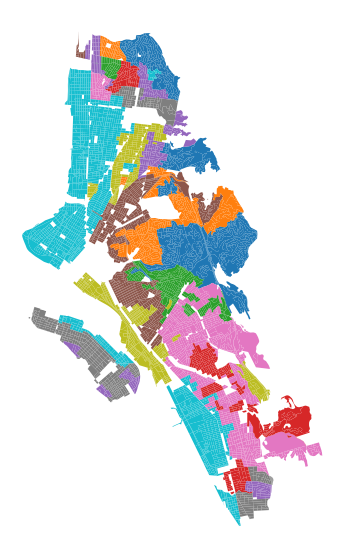

In [17]:
nx.set_node_attributes(graph, race_matrix['total'].to_dict(), name='population')
init_partition = Partition(graph, 
                    assignment=race_matrix.to_dict()['partition'],
                    updaters={'population' : Tally('population')})
init_partition.plot(figsize=(10,10))
plt.axis('off')

In [18]:
ideal_population = sum(compute_total_pop(init_partition).values()) / len(init_partition)
from gerrychain.proposals import spectral_recom
proposal = partial(recom, 
                    pop_col='population', 
                    pop_target=ideal_population,
                    epsilon=100,
                    node_repeats=20000000)
chain = MarkovChain(proposal=propose_chunk_flip, 
                    constraints=[no_vanishing_districts],
                    accept=always_accept, 
                    initial_state=init_partition, 
                    total_steps=51000)
print('Prereqs created, chain running...')
# burn-in of 1000
iter(chain)
_ = [next(chain) for i in range(1000)]
oak_entropies = [chain_to_entropy(step, race_matrix) for step in tqdm(chain)]

Prereqs created, chain running...


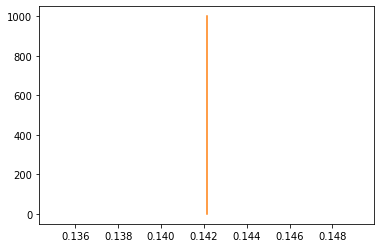

In [19]:
import seaborn as sns
sns.kdeplot(oak_entropies)
plt.plot(np.repeat(city_entropy(R.to_numpy()[:, 1:], R.to_numpy()[:, 0]),2), [0, 1000])